# How to do research and visualize progress

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/baal-org/baal/blob/master/notebooks/active_learning_process.ipynb)

In this tutorial, we will show how to use Baal for research ie. when we know the labels.
We will introduce notions such as dataset management, MC-Dropout, BALD. If you need more documentation, be sure to check our **Additional resources** section below!

BaaL can be used on a variety of research domains:

- Active Learning
- Uncertainty estimation
- Fairness, Accountability, Transparency and Ethics (FATE)
- And more!

Today we will focus on a simple example with CIFAR10 and we will animate the progress of active learning!

#### Additional resources

* More info on the inner working of Active Learning Dataset [here](./fundamentals/active-learning.ipynb).
* To know more about Bayesian deep learning please see our
 [Literature review](https://baal.readthedocs.io/en/latest/literature/core-papers.html).

### Let's do this!

In [1]:
# Let's start with a bunch of imports.

import random
from dataclasses import dataclass

import numpy as np
import torch
import torch.backends
import torch.utils.data as torchdata
from torch import optim
from torch.hub import load_state_dict_from_url
from torch.nn import CrossEntropyLoss
from torchvision import datasets
from torchvision import models
from torchvision.transforms import transforms

from baal.active import get_heuristic, ActiveLearningDataset
from baal.bayesian.dropout import patch_module
from baal.modelwrapper import ModelWrapper


def vgg16(num_classes):
    model = models.vgg16(num_classes=num_classes)
    # Load Imagenet weights to start.
    weights = load_state_dict_from_url('https://download.pytorch.org/models/vgg16-397923af.pth')
    weights = {k: v for k, v in weights.items() if 'classifier.6' not in k}
    model.load_state_dict(weights, strict=False)
    return model

/home/fred/workspace/baal/baal/modelwrapper.py:15: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


### Dataset management and the pool

At many places in our library, we mention the **pool**, but what is it?
The pool is simply the set of unlabelled examples, the example that the model has not deemed important
 enough to be labelled.

In BaaL, the object that manages this is called the `baal.active.ActiveLearningDataset`.
 You supply it with your dataset and by default, everything is unlabelled.

`al_dataset = ActiveLearningDataset(your_dataset)`

You can then start with the initial number of examples that are labelled randomly. Let's label 100 examples.

`al_dataset.label_randomly(100)`

When iterating over `al_dataset`, you will only get the labelled examples. If you need to work on the **pool**,
then you can call `al_dataset.pool` which would return it.


**How can I disable data augmentation when iterating on the pool?**

Disabling data augmentation when computing uncertainty is preferable, we wouldn't want to disrupt the uncertainty estimation.
Fortunately, BaaL can help you with that.

In `ActiveLearningDataset`, we can supply the attribute `pool_specifics` with a dictionary of what to modify in the pool.
For example, my `Dataset` has an attribute `transform` which applies the data augmentation.
I can modify with:

`ActiveLearningDataset(your_dataset, pool_specifics:{'transform': test_transform}`

where `test_transform` is the test version of `transform` without data augmentation.


Here we define our Experiment configuration, this can come from your favorite experiment manager like MLFlow.
BaaL does not expect a particular format as all arguments are supplied.

In [2]:


@dataclass
class ExperimentConfig:
    epoch: int = 20000 // 100
    batch_size: int = 32
    initial_pool: int = 512
    query_size: int = 100
    lr: float = 0.001
    heuristic: str = 'bald'
    iterations: int = 20
    training_duration: int = 5



### Problem definition

We will perform active learning on a toy dataset, CIFAR-3 where we only keep dogs, cats and airplanes. This will make
visualization easier.

In [3]:
def get_datasets(initial_pool):
    """
    Let's create a subset of CIFAR10 named CIFAR3, so that we can visualize thing better.
    
    We will only select the classes airplane, cat and dog.
    
    Args:
        initial_pool: Amount of labels to start with.
        
    Returns:
        ActiveLearningDataset, Dataset, the training and test set.
    """

    class TransformAdapter(torchdata.Subset):
        # We need a custom Subset class as we need to override "transforms" as well.
        # This shouldn't be needed for your experiments.
        @property
        def transform(self):
            if hasattr(self.dataset, 'transform'):
                return self.dataset.transform
            else:
                raise AttributeError()

        @transform.setter
        def transform(self, transform):
            if hasattr(self.dataset, 'transform'):
                self.dataset.transform = transform

    # airplane, cat, dog
    classes_to_keep = [0, 3, 5]
    transform = transforms.Compose(
        [transforms.Resize((32, 32)),
         transforms.RandomHorizontalFlip(),
         transforms.RandomRotation(30),
         transforms.ToTensor(),
         transforms.Normalize(3 * [0.5], 3 * [0.5]), ])
    test_transform = transforms.Compose(
        [
            transforms.Resize((32, 32)),
            transforms.ToTensor(),
            transforms.Normalize(3 * [0.5], 3 * [0.5]),
        ]
    )
    train_ds = datasets.CIFAR10('.', train=True,
                                transform=transform, target_transform=None, download=True)

    train_mask = np.where([y in classes_to_keep for y in train_ds.targets])[0]
    train_ds = TransformAdapter(train_ds, train_mask)

    # In a real application, you will want a validation set here.
    test_set = datasets.CIFAR10('.', train=False,
                                transform=test_transform, target_transform=None, download=True)
    test_mask = np.where([y in classes_to_keep for y in test_set.targets])[0]
    test_set = TransformAdapter(test_set, test_mask)

    # Here we set `pool_specifics`, where we set the transform attribute for the pool.
    active_set = ActiveLearningDataset(train_ds, pool_specifics={'transform': test_transform})

    # We start labeling randomly.
    active_set.label_randomly(initial_pool)
    return active_set, test_set

## Creating our experiment

We are now ready to instantiate all of our components:

1. Our `ActiveLearningDataset` and a test dataset.
2. Our heuristic (BALD)
3. Our model and its criterion.

BaaL simplifies your experiments by providing ModelWrapper and ActiveLearningExperiment.

* ModelWrapper
  * Performs MC sampling efficiently
  * Training/testing loops
* ActiveLearningExperiment
  * Train and evaluate a new model per active step.
  * Will make prediction on the pool and label the most uncertain examples.
  * Stop the experiment when reaching the end (according to a plateau or exhaustion)

In [4]:
import structlog, logging
structlog.configure(wrapper_class=structlog.make_filtering_bound_logger(logging.WARNING))


from baal.active.stopping_criteria import LabellingBudgetStoppingCriterion
from baal.experiments.base import ActiveLearningExperiment
from baal.modelwrapper import TrainingArgs

hyperparams = ExperimentConfig()
use_cuda = torch.cuda.is_available()
torch.backends.cudnn.benchmark = True
random.seed(1337)
torch.manual_seed(1337)
if not use_cuda:
    print("warning, the experiments would take ages to run on cpu")

# Get datasets
active_set, test_set = get_datasets(hyperparams.initial_pool)
# Stop at 10k examples labelled.
stopping_criterion = LabellingBudgetStoppingCriterion(active_set, labelling_budget=10000)

# Get our model.
heuristic = get_heuristic(hyperparams.heuristic)
criterion = CrossEntropyLoss()
model = vgg16(num_classes=10)

# change dropout layer to MCDropout
model = patch_module(model)

if use_cuda:
    model.cuda()
optimizer = optim.SGD(model.parameters(), lr=hyperparams.lr, momentum=0.9)

# Wraps the model into a usable API.
model = ModelWrapper(model, TrainingArgs(
    optimizer=optimizer, batch_size=hyperparams.batch_size, epoch=hyperparams.training_duration, criterion=criterion
))

experiment = ActiveLearningExperiment(trainer=model,
                                      al_dataset=active_set,
                                      eval_dataset=test_set,
                                      heuristic=heuristic,
                                      query_size=250, # How many item to label per step
                                      iterations=20, # Number of sampling per Monte Carlo sampling
                                      criterion=stopping_criterion) # When to stop the experiment
metrics = experiment.start()
print(metrics)


Files already downloaded and verified
Files already downloaded and verified


Active Experiment:   0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/453 [00:00<?, ?it/s]

  0%|          | 0/445 [00:00<?, ?it/s]

  0%|          | 0/438 [00:00<?, ?it/s]

  0%|          | 0/430 [00:00<?, ?it/s]

  0%|          | 0/422 [00:00<?, ?it/s]

  0%|          | 0/414 [00:00<?, ?it/s]

  0%|          | 0/406 [00:00<?, ?it/s]

  0%|          | 0/399 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/383 [00:00<?, ?it/s]

  0%|          | 0/375 [00:00<?, ?it/s]

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/359 [00:00<?, ?it/s]

  0%|          | 0/352 [00:00<?, ?it/s]

  0%|          | 0/344 [00:00<?, ?it/s]

  0%|          | 0/336 [00:00<?, ?it/s]

  0%|          | 0/328 [00:00<?, ?it/s]

  0%|          | 0/320 [00:00<?, ?it/s]

  0%|          | 0/313 [00:00<?, ?it/s]

  0%|          | 0/305 [00:00<?, ?it/s]

  0%|          | 0/297 [00:00<?, ?it/s]

  0%|          | 0/289 [00:00<?, ?it/s]

  0%|          | 0/281 [00:00<?, ?it/s]

  0%|          | 0/274 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/258 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/242 [00:00<?, ?it/s]

  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

  0%|          | 0/211 [00:00<?, ?it/s]

  0%|          | 0/203 [00:00<?, ?it/s]

  0%|          | 0/195 [00:00<?, ?it/s]

  0%|          | 0/188 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/172 [00:00<?, ?it/s]

  0%|          | 0/164 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

  0%|          | 0/149 [00:00<?, ?it/s]

[{'train_loss': 0.5712721943855286, 'dataset_size': 512, 'test_loss': 0.5620654225349426}, {'train_loss': 0.5181156992912292, 'dataset_size': 762, 'test_loss': 0.5286405086517334}, {'train_loss': 0.5350638628005981, 'dataset_size': 1012, 'test_loss': 0.4601480960845947}, {'train_loss': 0.5402665138244629, 'dataset_size': 1262, 'test_loss': 0.44440504908561707}, {'train_loss': 0.5860735774040222, 'dataset_size': 1512, 'test_loss': 0.47883403301239014}, {'train_loss': 0.575564444065094, 'dataset_size': 1762, 'test_loss': 0.5090253353118896}, {'train_loss': 0.5579503178596497, 'dataset_size': 2012, 'test_loss': 0.4453035593032837}, {'train_loss': 0.56048983335495, 'dataset_size': 2262, 'test_loss': 0.42661961913108826}, {'train_loss': 0.517300009727478, 'dataset_size': 2512, 'test_loss': 0.470584511756897}, {'train_loss': 0.5614649653434753, 'dataset_size': 2762, 'test_loss': 0.4132825434207916}, {'train_loss': 0.5185147523880005, 'dataset_size': 3012, 'test_loss': 0.4163942039012909}, {'

## Visualization

Now that our active learning experiment is completed, we can visualize it!

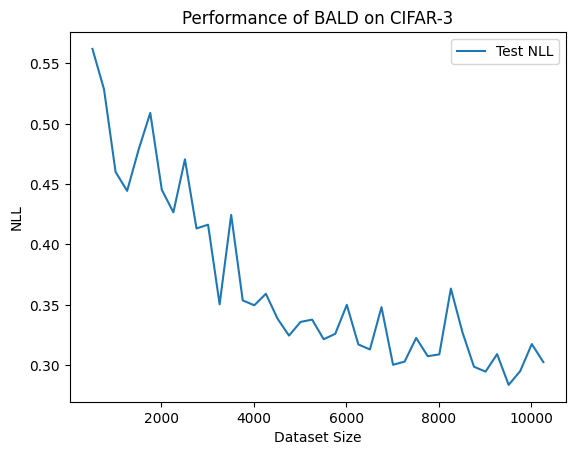

In [13]:
import matplotlib.pyplot as plt

x,y = zip(*[(step['dataset_size'], step['test_loss']) for step in metrics])
plt.plot(x,y, label='Test NLL')
plt.xlabel('Dataset Size')
plt.ylabel('NLL')
plt.title("Performance of BALD on CIFAR-3")
plt.legend()
plt.show()

## Visualize progress using t-SNE
We will use scikit-learn to get a t-SNE representation of our dataset. This will allows us to visualize the progress.

In [5]:
# modify our model to get features
from torch import nn
from torch.utils.data import DataLoader


# Make a feature extractor from our trained model.
class FeatureExtractor(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return torch.flatten(self.model.features(x), 1)


features = FeatureExtractor(model.model)
acc = []
for x, y in DataLoader(active_set._dataset, batch_size=10):
    acc.append((features(x.cuda()).detach().cpu().numpy(), y.detach().cpu().numpy()))

xs, ys = zip(*acc)

In [6]:
from sklearn.manifold import TSNE

# Compute t-SNE on the extracted features.
tsne = TSNE(n_jobs=4)
transformed = tsne.fit_transform(np.vstack(xs))

In [7]:
labels = np.concatenate(ys)
labels.shape

(15000,)

To make the animation, BaaL has `baal.utils.plot_utils.make_animation_from_data` which takes a set of features, their labels
 and the array containing the progress we created earlier.

In [8]:
from baal.utils.plot_utils import make_animation_from_data

# Create frames to animate the process.
frames = make_animation_from_data(transformed, labels, active_set.labelled_map, ["airplane", "cat", "dog"])


In [9]:
%matplotlib inline
from IPython.display import HTML
import matplotlib.pyplot as plt
from matplotlib import animation


def plot_images(img_list):
    def init():
        img.set_data(img_list[0])
        return (img,)

    def animate(i):
        img.set_data(img_list[i])
        return (img,)

    fig = plt.Figure(figsize=(10, 10))
    ax = fig.gca()
    img = ax.imshow(img_list[0])
    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=len(img_list), interval=60, blit=True)
    return anim


HTML(plot_images(frames).to_jshtml())

### Conclusion

And that's it! Using a couple lines of code, we were able to run our active learning experiment and plot
the progress on a t-SNE representation.
